# Setup

In [1]:
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/config.py
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/detector.py
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/reid.py
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/tracker.py
!wget https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/visuals.py

--2025-05-05 05:50:32--  https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/config.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 870 [text/plain]
Saving to: ‘config.py’

config.py           100%[===================>]     870  --.-KB/s    in 0s      

2025-05-05 05:50:32 (77.0 MB/s) - ‘config.py’ saved [870/870]

--2025-05-05 05:50:33--  https://raw.githubusercontent.com/zb-umkc/mot/refs/heads/main/detector.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13401 (13K) [text/plain]
Saving to: ‘detector.py’

detector

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Project Walkthrough

### Import from local files

In [4]:
from detector import *
from reid import *
from tracker import *
from visuals import *
from config import *

### Show examples of data augmentation

Raw: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]
Color: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]
Gaussian Blur: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]
Motion Blur: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]
Gray: [torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920]), torch.Size([3, 1080, 1920])]


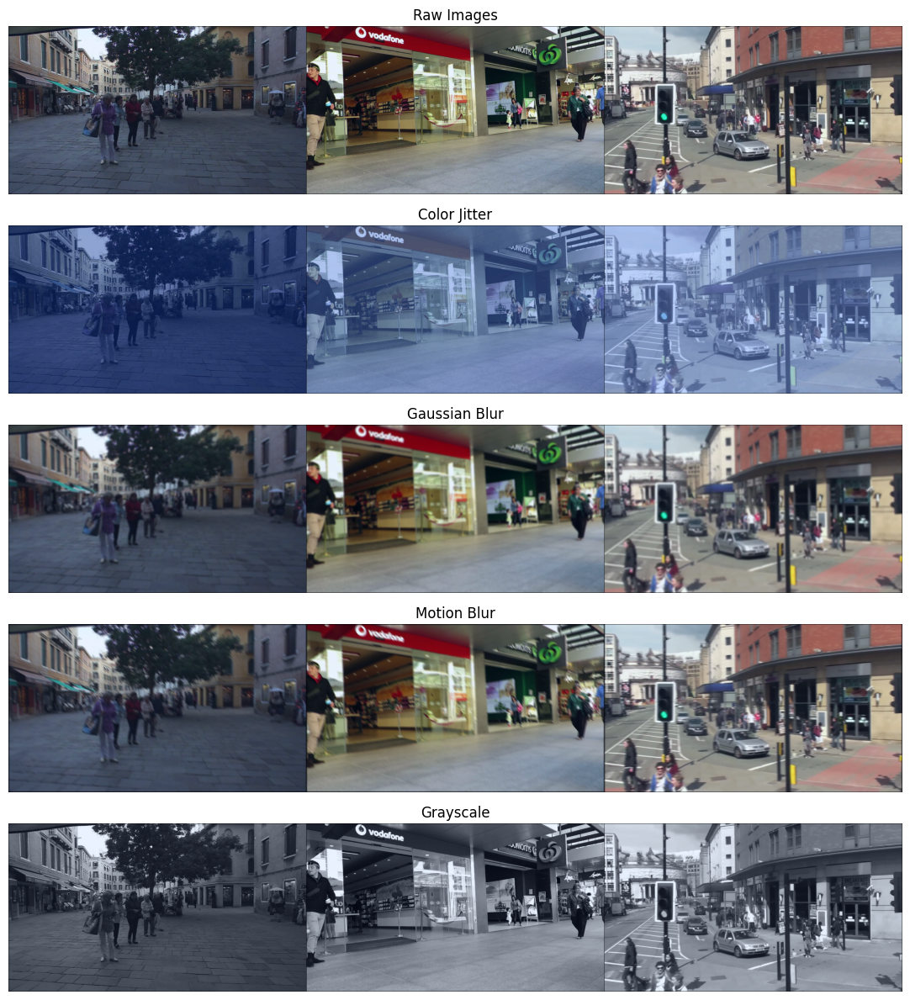

In [5]:
demo_augmentation()

### Train detection model

In [7]:
# train_detection_model()

In [ ]:
# 3/3
# Epoch 0 | Learning Rate: 0.005
# -- Train Loss: 0.5448048710823059
# ---- Classifier: 0.15316608548164368
# ---- Box Reg: 0.3215414583683014
# ---- Objectness: 0.05010727047920227
# ---- RPN Box Reg: 0.01999000459909439
# -- Val Loss: 0.43236246705055237

In [ ]:
# 4/30
# Epoch 0 | Learning Rate: 0.005
# -- Train Loss: 0.7127124071121216
# ---- Classifier: 0.2198037952184677
# ---- Box Reg: 0.3133603632450104
# ---- Objectness: 0.04752182587981224
# ---- RPN Box Reg: 0.13202646374702454
# -- Val Loss: 1.0914479494094849

In [ ]:
# 5/1
# Epoch 3 | Learning Rate: 0.0005
# -- Train Loss: 0.5198773741722107
# ---- Classifier: 0.19165439903736115
# ---- Box Reg: 0.28446120023727417
# ---- Objectness: 0.02778136171400547
# ---- RPN Box Reg: 0.015980398282408714
# -- Val Loss: 0.6860005855560303

### Load pre-trained detection model

In [8]:
detection_model = load_trained_detection_model(filename=ckpt_filename_det)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 229MB/s]


### Demonstrate positive/negative pairs for re-ID data

torch.Size([224, 224, 3])
torch.Size([224, 224, 3])
tensor([1.])


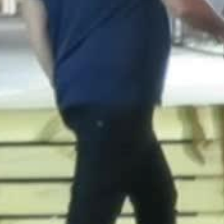

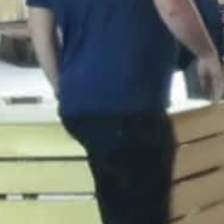

torch.Size([224, 224, 3])
torch.Size([224, 224, 3])
tensor([0.])


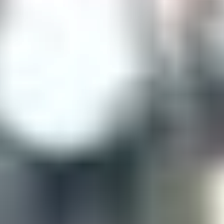

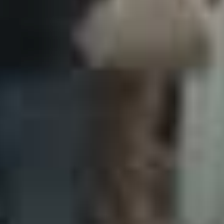

In [9]:
# Pos = view of same object from nearby frame
demo_reid_pairs(type="pos")

# Neg = view of different object from nearby frame
demo_reid_pairs(type="neg")

### Train re-ID model

In [11]:
# train_reid_model()

In [ ]:
# Epoch [1/4], Loss: 0.9746491682648659
# Epoch [2/4], Loss: 0.05947302592039108
# Epoch [3/4], Loss: 0.05228259210884571
# Epoch [4/4], Loss: 0.04809821047306061

### Load pre-trained re-ID model

In [12]:
reid_model = load_trained_reid_model(filename=ckpt_filename_reid)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### Run inference on a video

In [13]:
seq_name = "MOT16-01"
preds_df = run_inference(seq_name, detection_model, reid_model)

print(preds_df.shape)
preds_df.head()

  0%|          | 0/5919 [00:00<?, ?it/s]

(2049, 6)


,frame_id,obj_id,x1,y1,x2,y2
0,1,1,765,460,813,586
1,1,2,714,468,758,586
2,1,3,876,499,908,582
3,1,4,434,555,607,680
4,1,5,665,457,698,545


### Show a few example frames with predictions

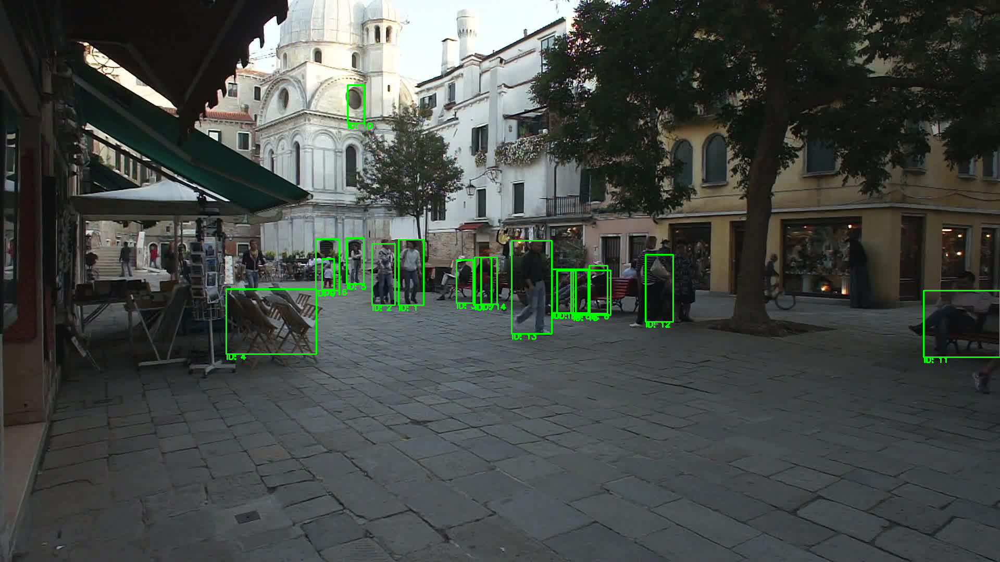

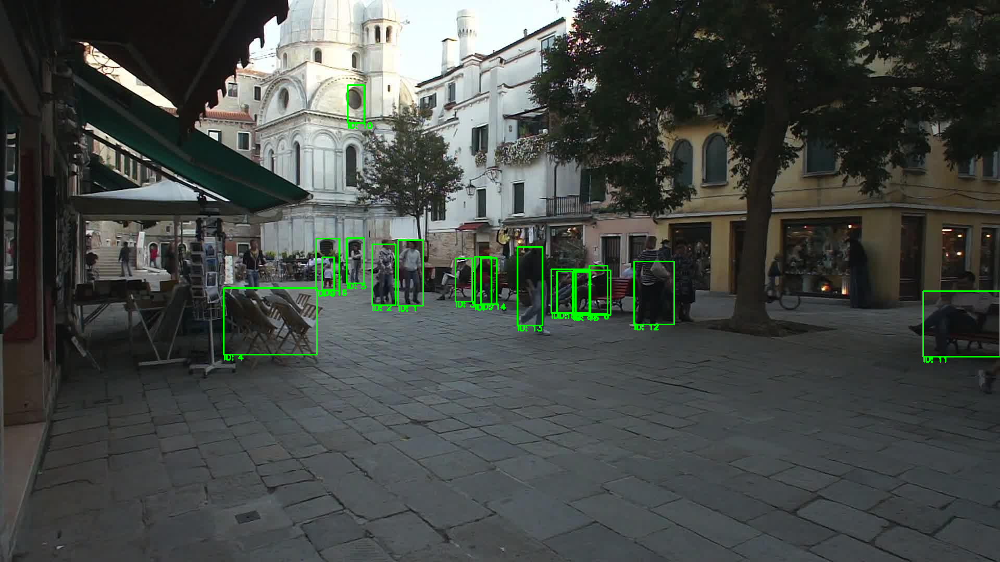

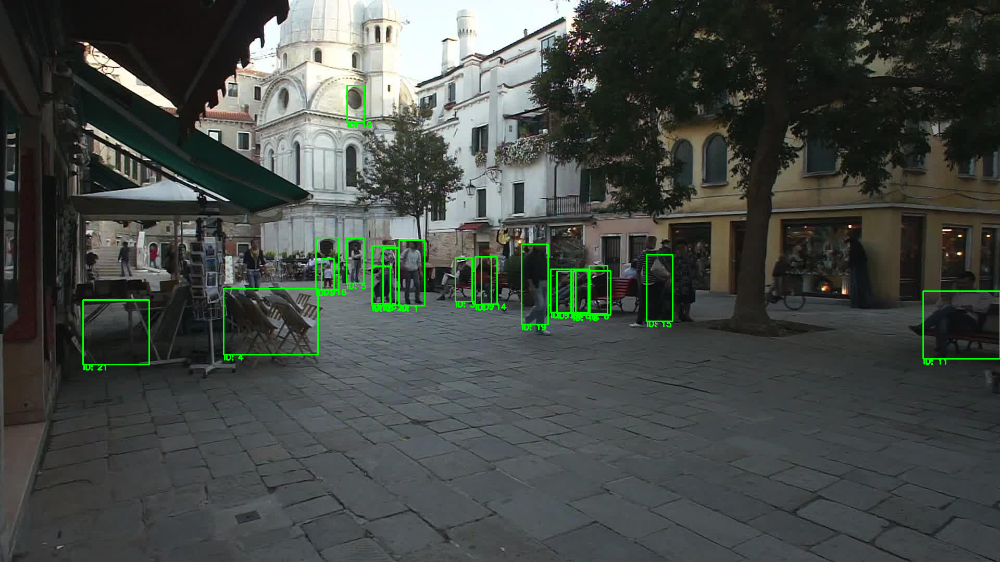

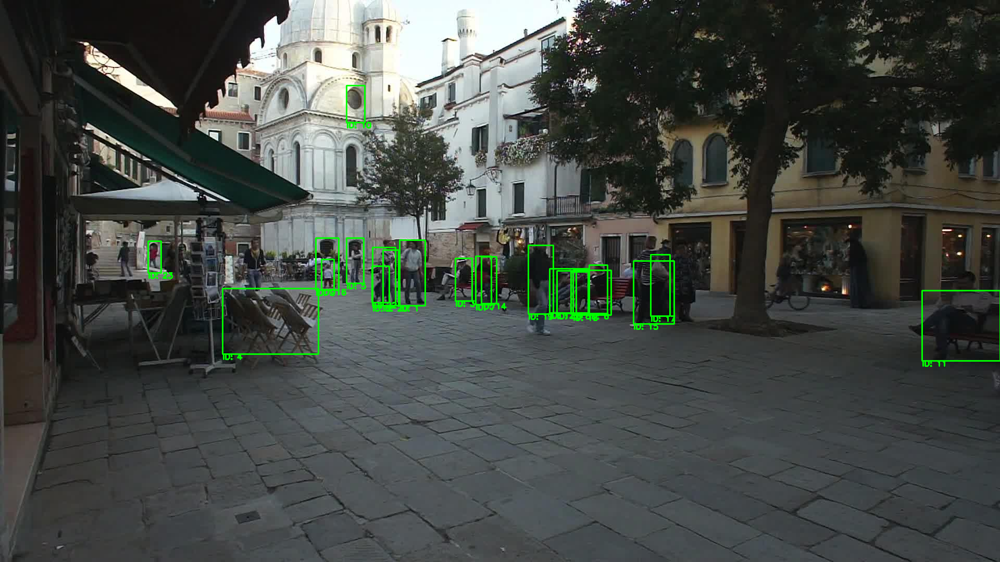

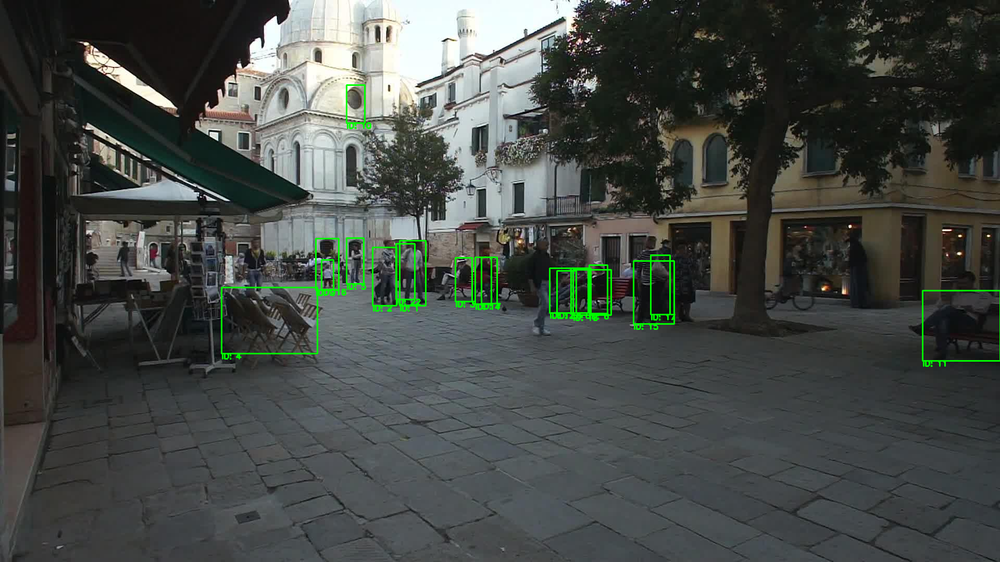

In [14]:
for i in range(1, 6):
    display_frame(data_dir=data_dir_test, seq="MOT16-01", frame_id=i, boxes=preds_df, label_loc="bottom")